# Exploring Time Series


## Introduction
In this notebook I plan to observe different kinds of time series data, see numbers evolve over time basically, explore seasonality and trends in them, do some tests and see if I can capture what sort of patterns hide in them. 

This is necessary preparation before modeling and forecasting data in any time series problem. Please start at the first link in Table of contents below.

Specifically, I will begin by examining a macroeconomic variable like inflation, exploring to understand its trends (if any), seasonality, and autocorrelations. Subsequently, I will investigate hourly ad views data, which typically exhibits seasonal patterns, and explore the impact of detrending on these patterns. Lastly, I will apply the analysis to financial datasets such as SP500, Microsoft, and Apple prices, with the goal of conducting multivariate analysis to uncover correlations and variance inflation between them. 


## Table of Contents
- [Start Explore](#Start-Explore)
- [CPI Explore](#CPI-Explore)
- [SP500 Explore](#SP500-Explore)

## CPI Explore

First look at the data

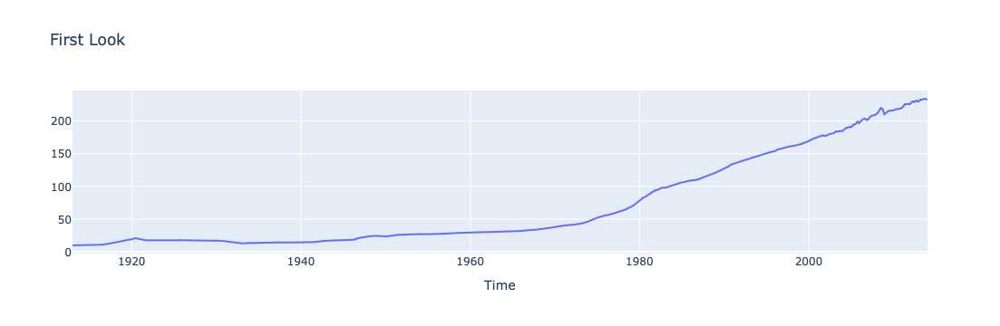

In [4]:
data_file = '../input/cpi-data.csv'
tsa = TSAnalysis()
feature_list = ['Index']
dataset = pd.read_csv(data_file, index_col='Date', parse_dates=['Date'])
dataset.index = pd.to_datetime(dataset.index, utc=True)
look = tsa.plot_data(dataset, columns = feature_list, title = 'First Look')
iplot(look)

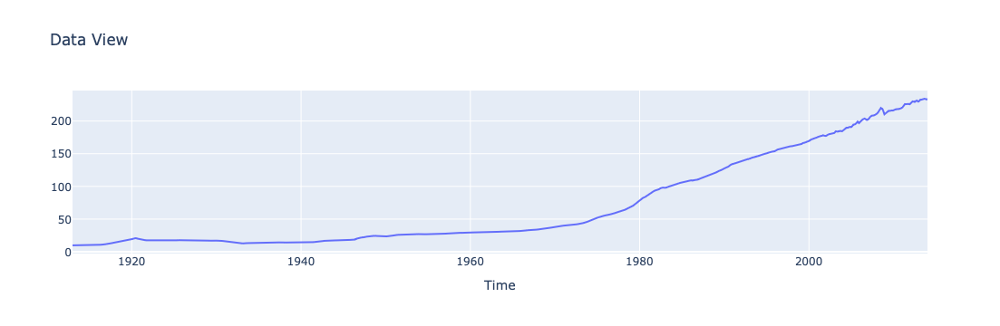

Stationarity Test:
Analysis Results:
ADF:
Passed: False
Test Results:
adf: {'statistic': 3.3042221177526403, 'p_value': 1.0, 'critical_values': {'1%': -3.4358202562873807, '5%': -2.8639555777313683, '10%': -2.568056097446774}}




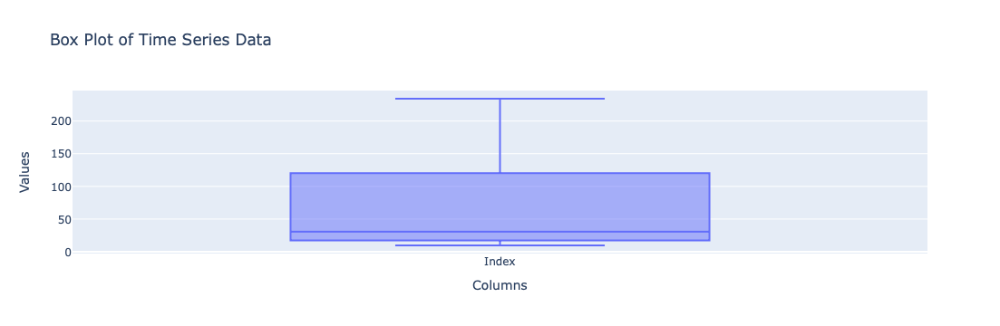

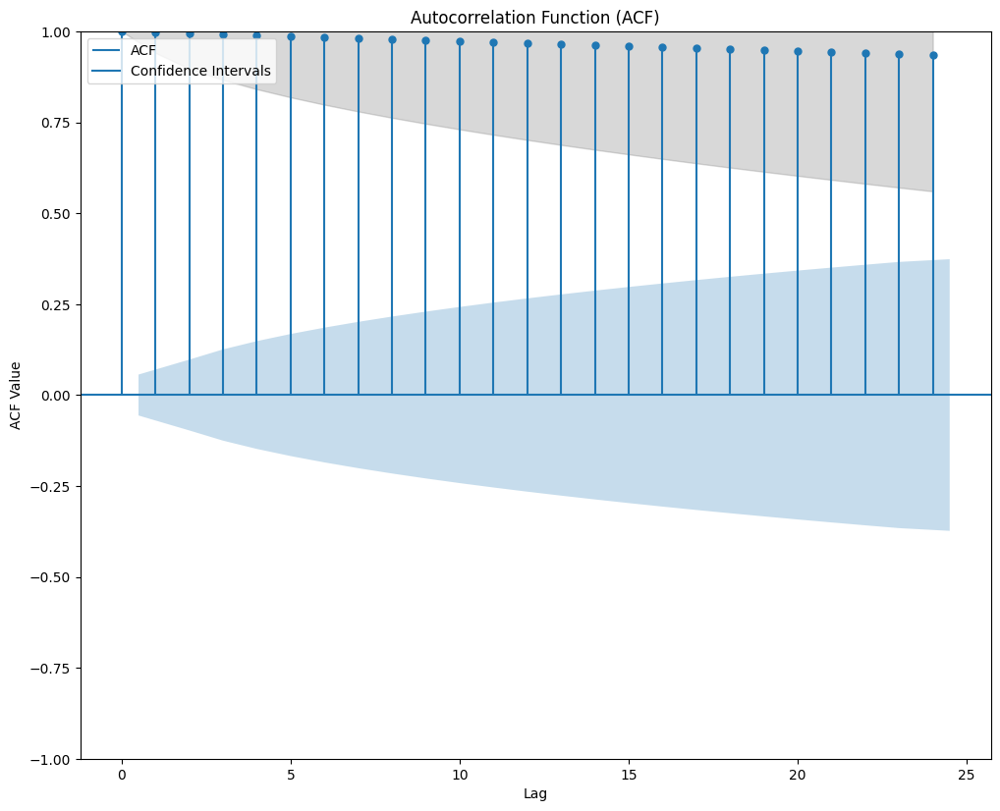

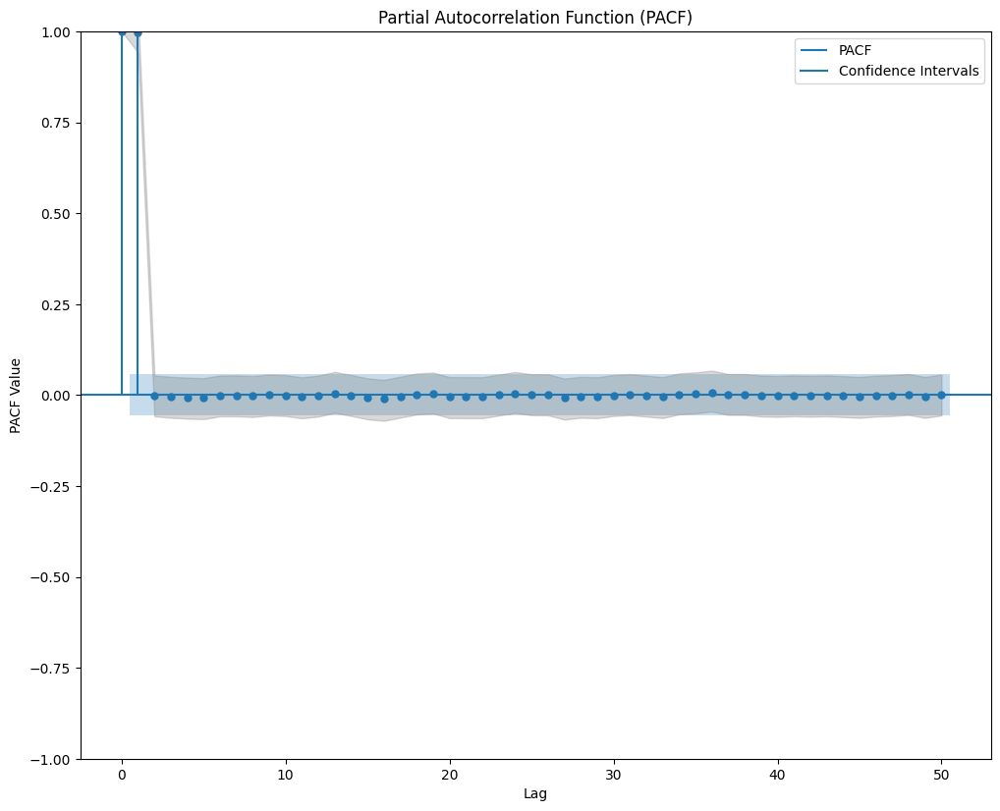

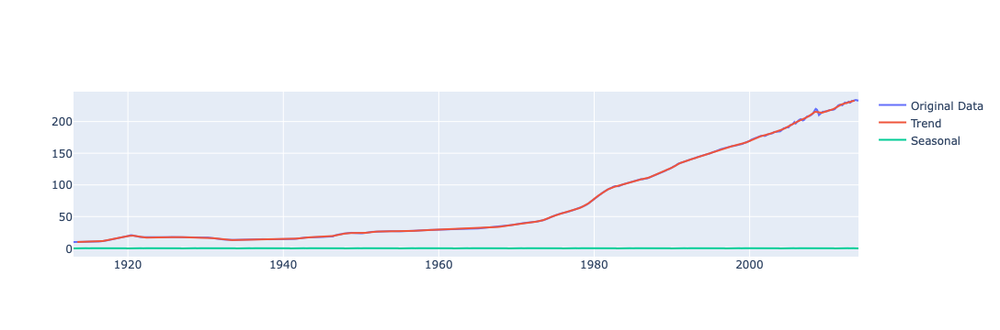

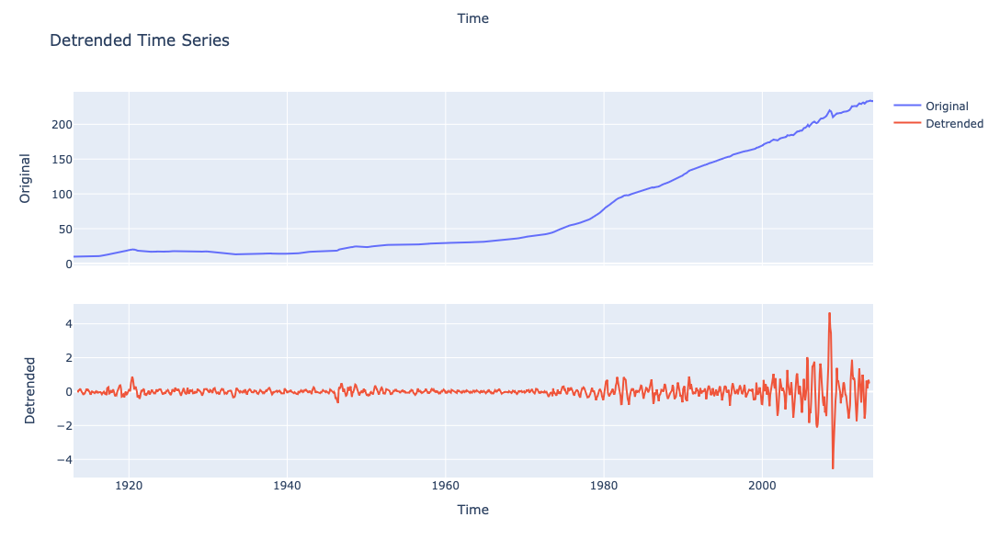

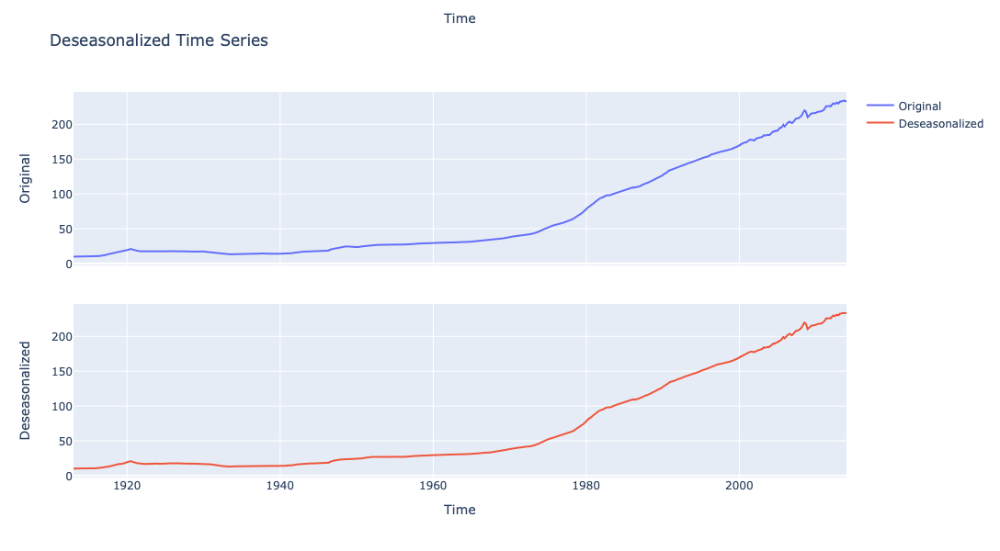

Stationarized data


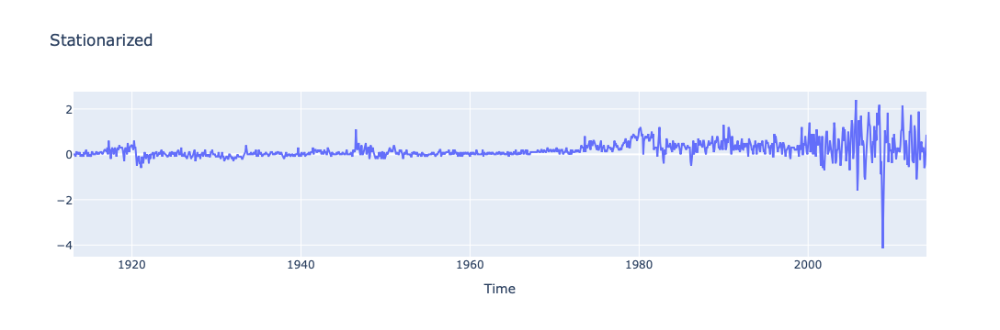

Analysis Results:
ADF:
Passed: False
Test Results:
adf: {'statistic': -2.634462759145604, 'p_value': 0.08608162181298828, 'critical_values': {'1%': -3.4358664022823593, '5%': -2.8639759363158124, '10%': -2.5680669397963927}}


Stationarized data


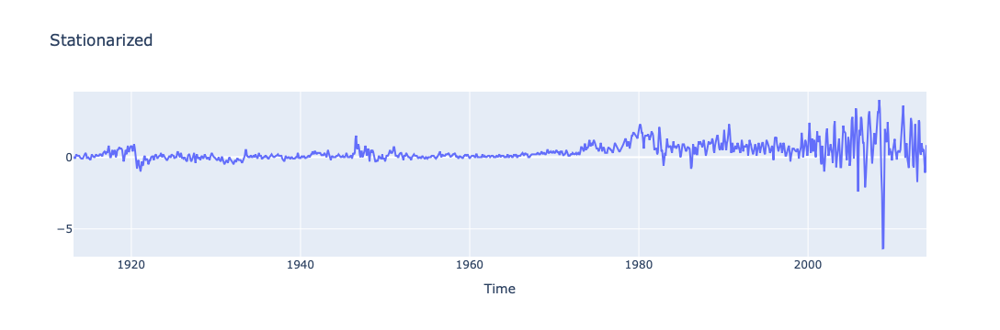

Analysis Results:
ADF:
Passed: False
Test Results:
adf: {'statistic': -2.5978731448031773, 'p_value': 0.09343764239979468, 'critical_values': {'1%': -3.4358664022823593, '5%': -2.8639759363158124, '10%': -2.5680669397963927}}


Stationarized data


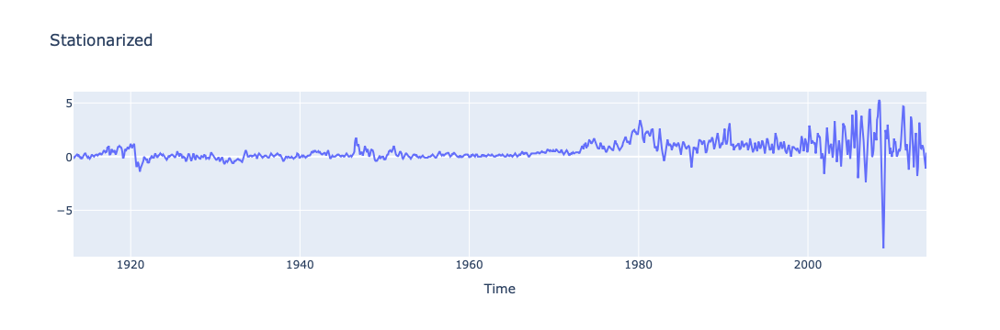

Analysis Results:
ADF:
Passed: False
Test Results:
adf: {'statistic': -2.699917786140997, 'p_value': 0.0740524967081813, 'critical_values': {'1%': -3.4358710597388042, '5%': -2.863977991064458, '10%': -2.5680680340944337}}




In [5]:
tsa = TSAnalysis()
ts = dataset[feature_list]
res = tsa.run_univariate_tests(ts)
t = tsa.detrend()
se = tsa.deseasonalize()
stationary1 = tsa.stationarize(ts, 'diff')
stationary2 = tsa.stationarize(ts, 'diff_2')
stationary3 = tsa.stationarize(ts, 'diff_3')

## CPI - Detrended

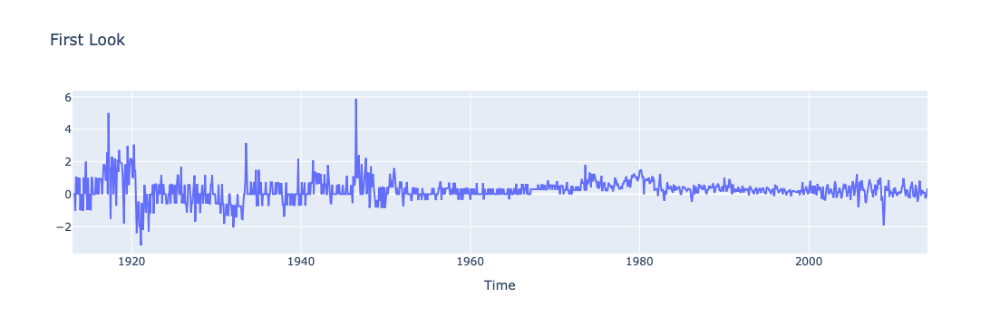

In [10]:
feature_list = ['Inflation']
look = tsa.plot_data(dataset, columns = feature_list, title = 'First Look')
iplot(look)

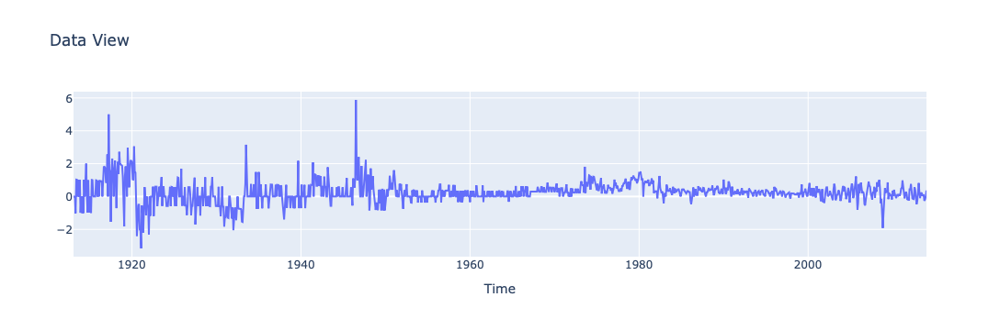

Stationarity Test:
Analysis Results:
ADF:
Passed: True
Test Results:
adf: {'statistic': -4.5876042408989814, 'p_value': 0.00013613831324392272, 'critical_values': {'1%': -3.4358664022823593, '5%': -2.8639759363158124, '10%': -2.5680669397963927}}


Missing Data:


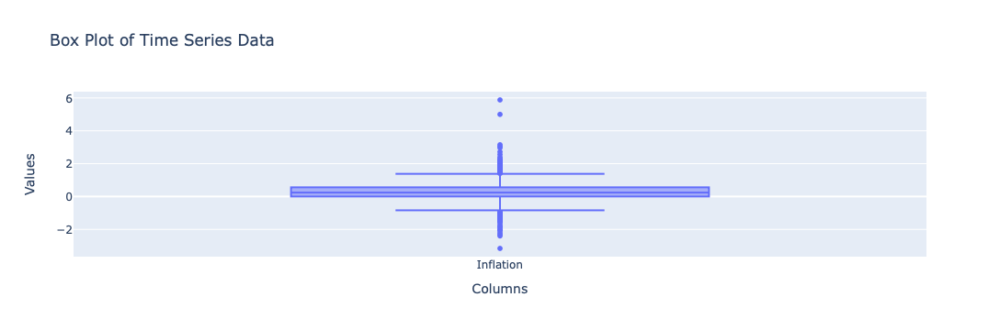

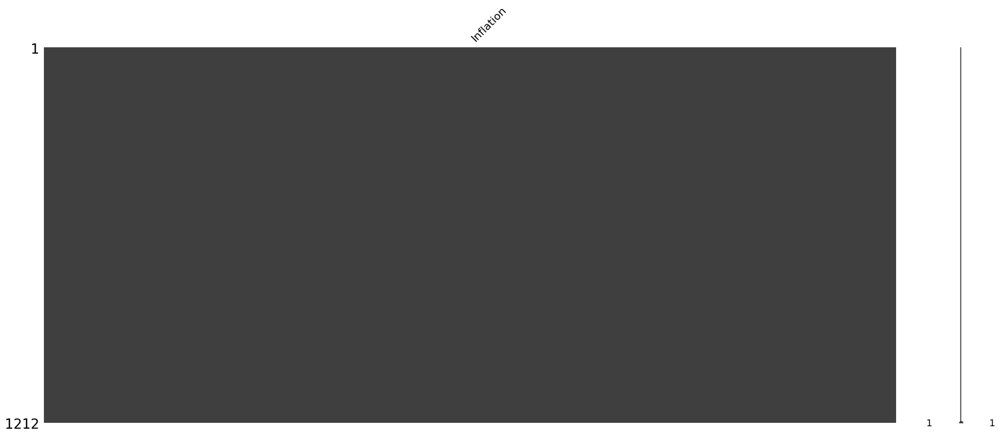

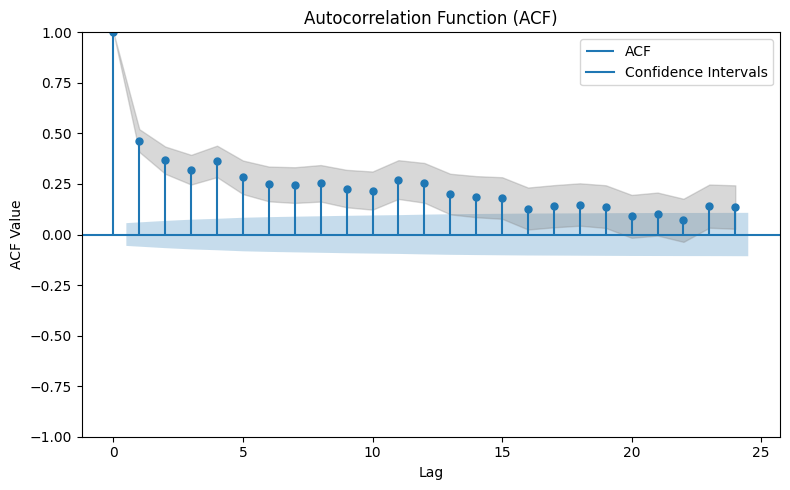

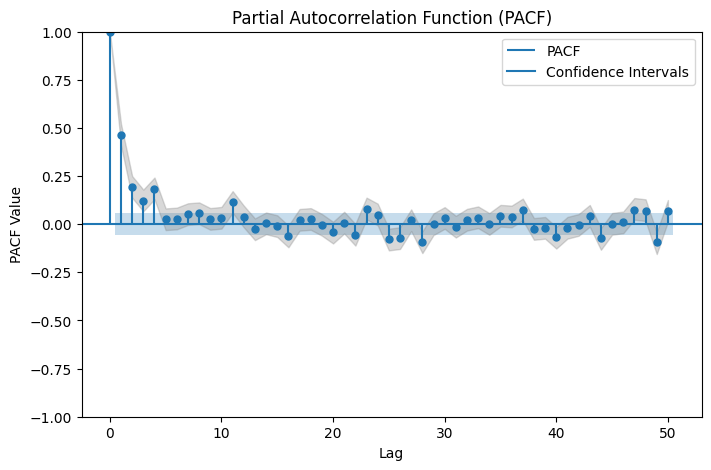

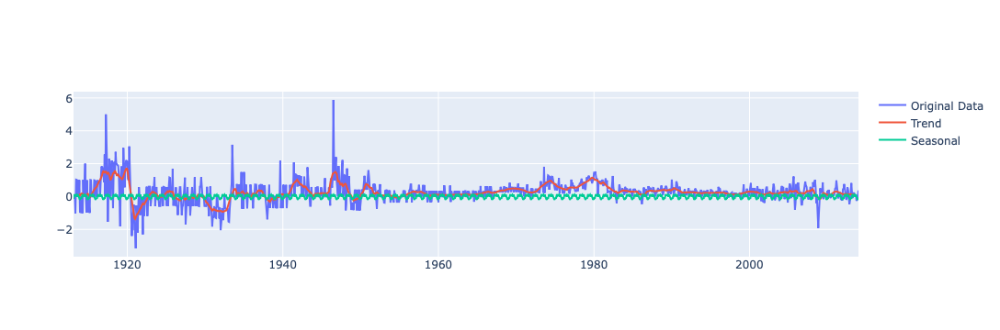

In [11]:
tsa = TSAnalysis()
ts = dataset[feature_list][1:]
res = tsa.run_univariate_tests(ts)

## Ad watching data

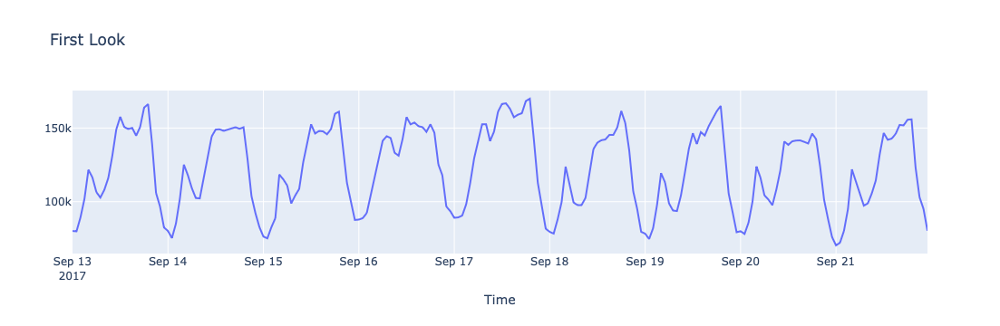

In [12]:
data_file = '../input/ads.csv'
feature_list = ['Ads']
dataset = pd.read_csv(data_file, index_col='Time', parse_dates=['Time'])
dataset.index = pd.to_datetime(dataset.index, utc=True)
dataset = dataset[:]
look = tsa.plot_data(dataset, columns = feature_list, title = 'First Look')
iplot(look)

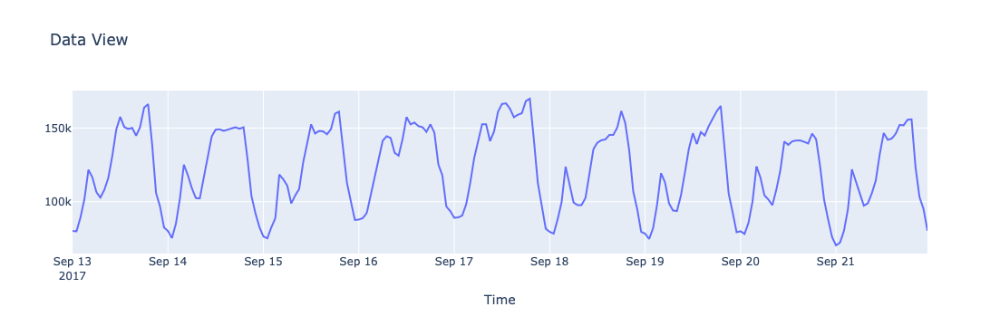

Stationarity Test:
Analysis Results:
ADF:
Passed: True
Test Results:
adf: {'statistic': -7.089633890638516, 'p_value': 4.444803688622402e-10, 'critical_values': {'1%': -3.4624988216864776, '5%': -2.8756749365852587, '10%': -2.5743041549627677}}


Missing Data:


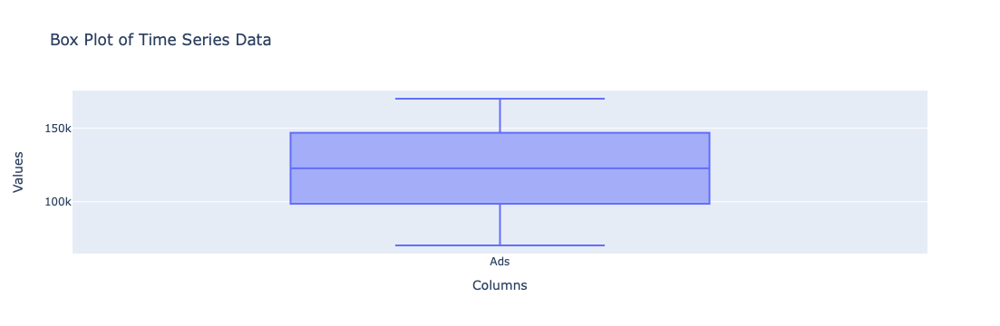

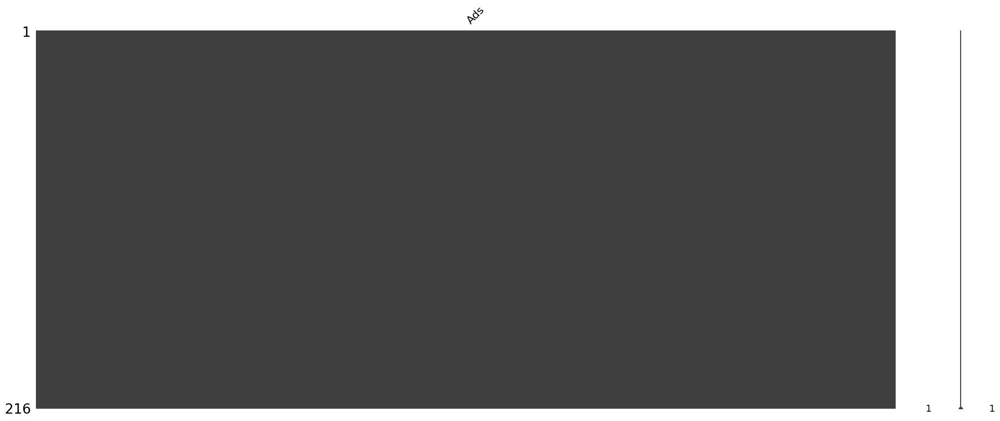

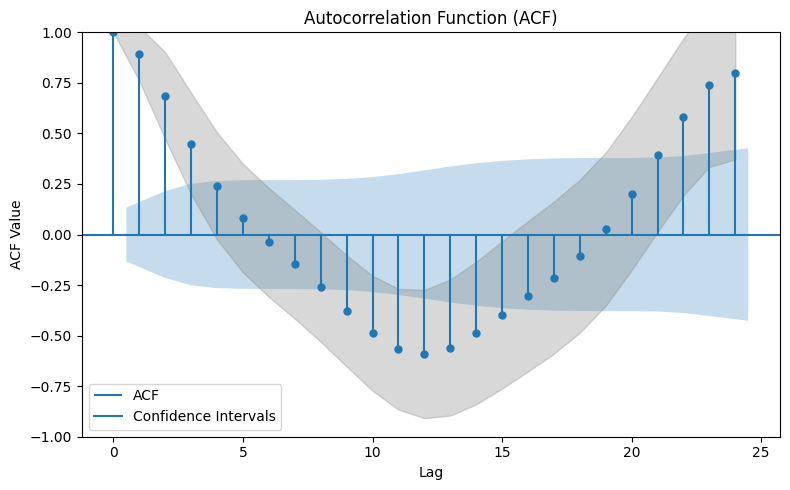

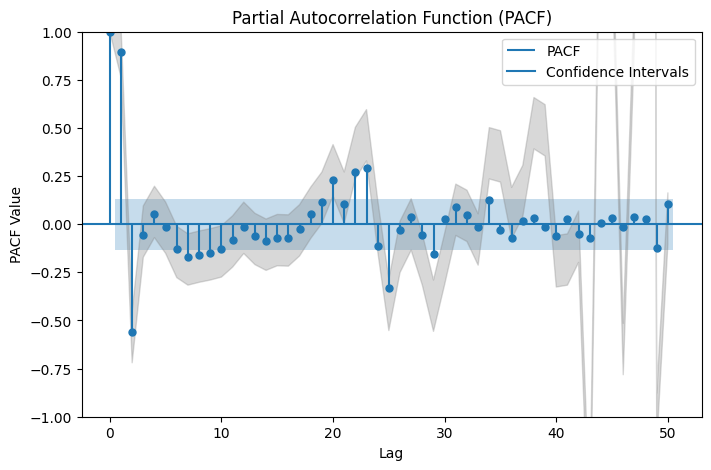

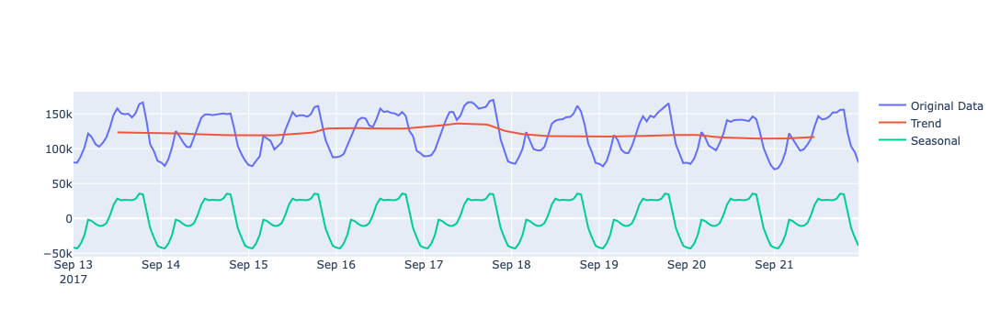

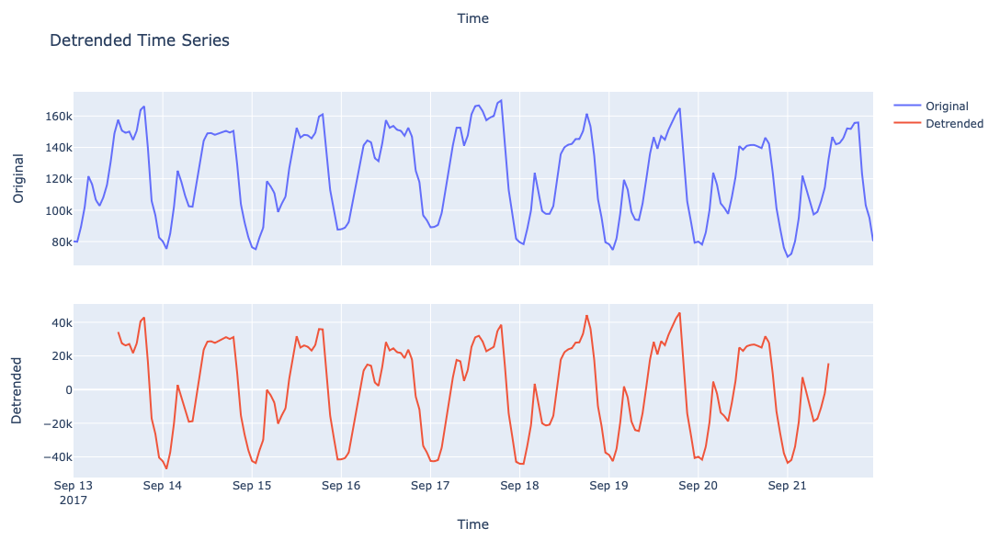

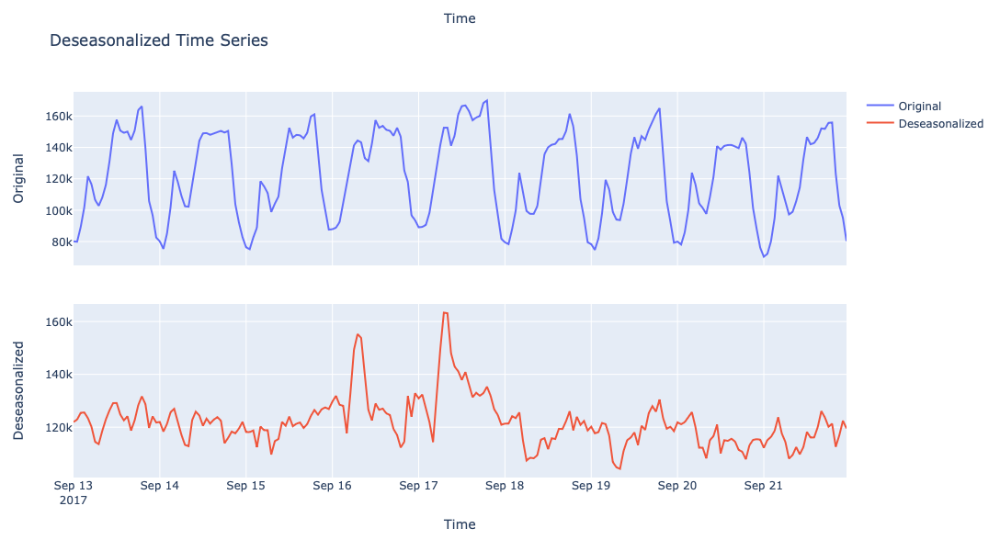

Stationarized data


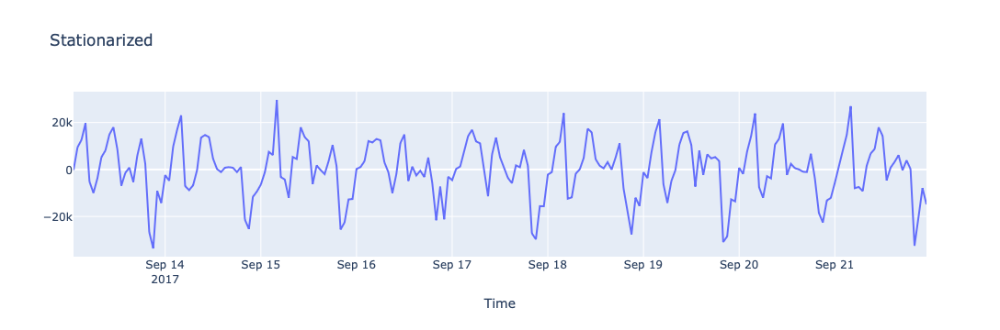

Analysis Results:
ADF:
Passed: True
Test Results:
adf: {'statistic': -6.614309284922976, 'p_value': 6.262978380424487e-09, 'critical_values': {'1%': -3.4636447617687436, '5%': -2.8761761179270766, '10%': -2.57457158581854}}




In [13]:
tsa = TSAnalysis()
ts = dataset[feature_list]
res = tsa.run_univariate_tests(ts)
tsa.detrend()
tsa.deseasonalize()
stationary = tsa.stationarize(ts, 'diff')

## SP500 Explore

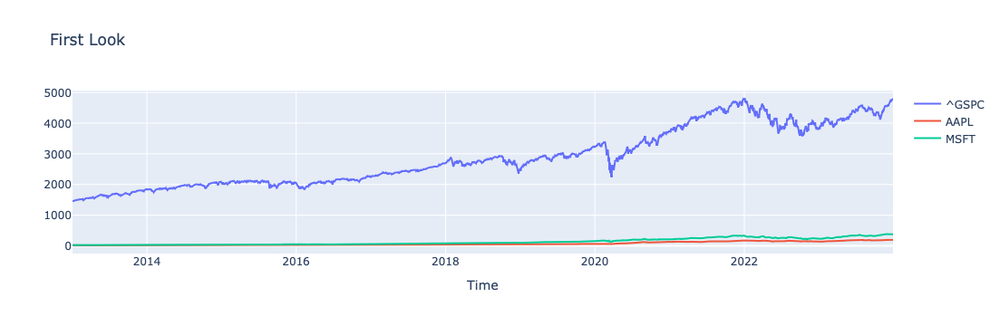

In [14]:
data_file = '../input/tstraining.csv'
feature_list = ['^GSPC','AAPL','MSFT']
dataset = pd.read_csv(data_file, index_col='Date', parse_dates=['Date'])
dataset.index = pd.to_datetime(dataset.index, utc=True)
dataset = dataset[:]
tsa = TSAnalysis()
look = tsa.plot_data(dataset, columns = feature_list, title = 'First Look')
iplot(look)

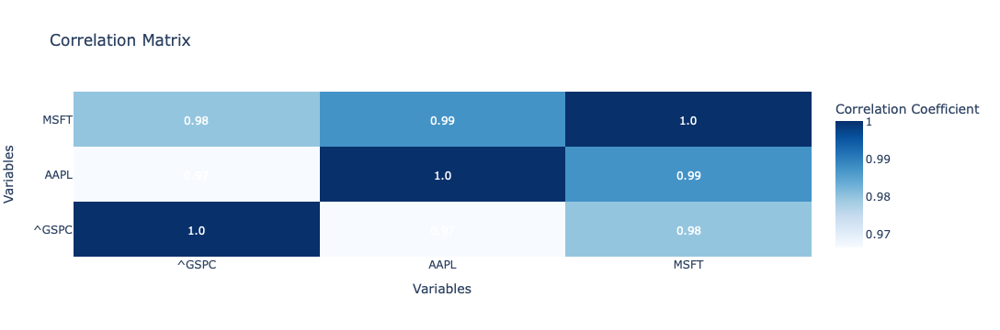

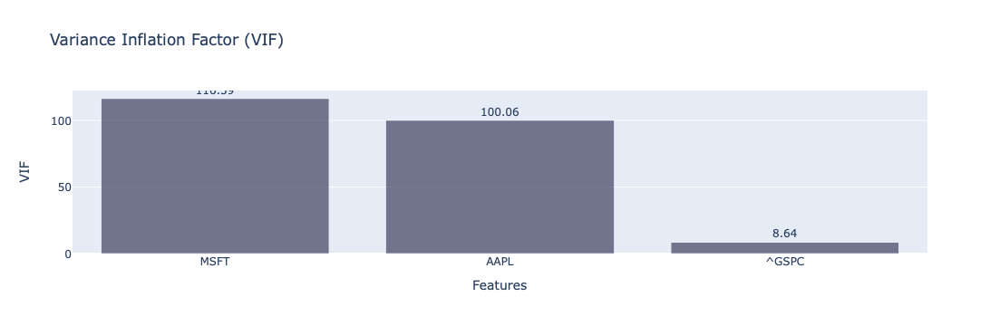

^GSPC Analysis:


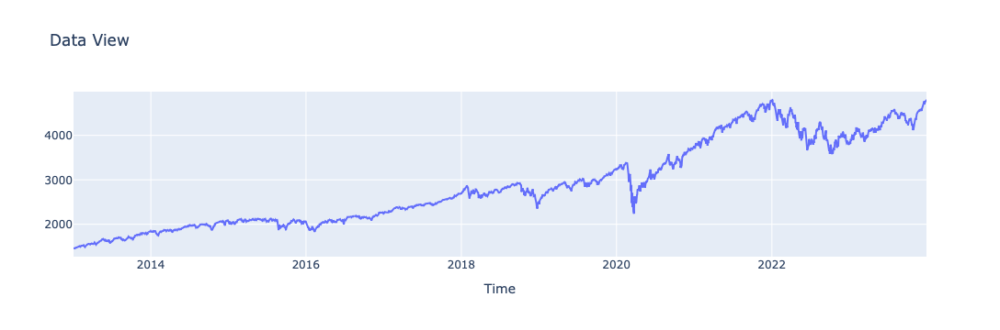

Stationarity Test:
Analysis Results:
ADF:
Passed: False
Test Results:
adf: {'statistic': -0.3720930058278132, 'p_value': 0.9146550116037366, 'critical_values': {'1%': -3.4327241019050643, '5%': -2.862588908594463, '10%': -2.5673283673779763}}


Missing Data:


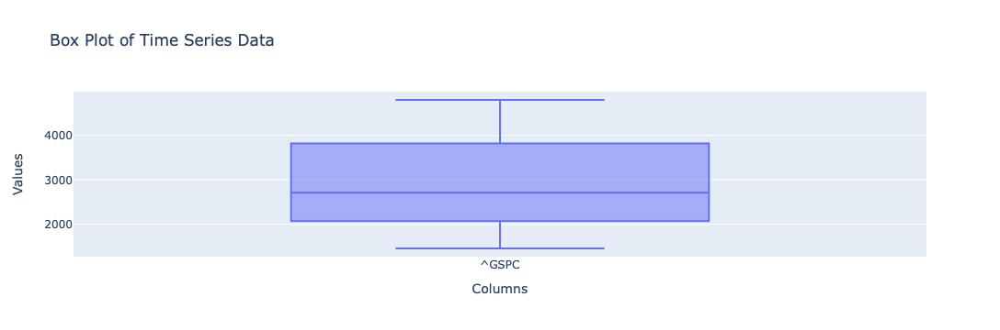

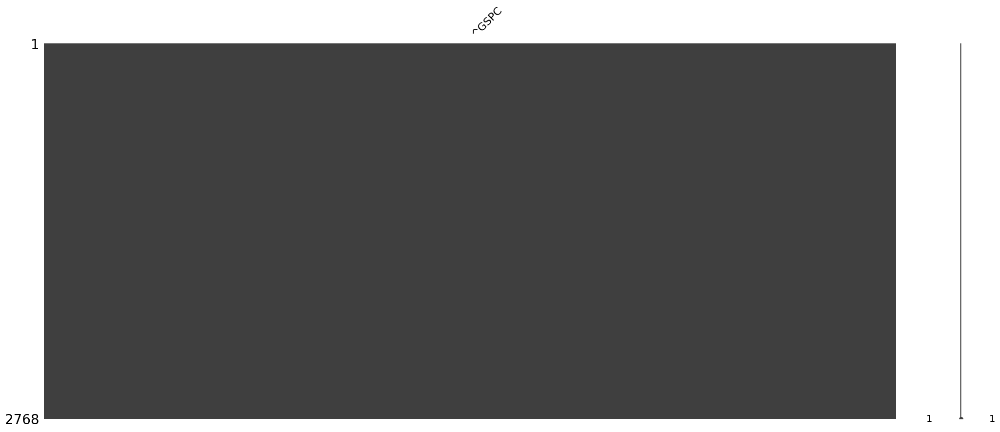

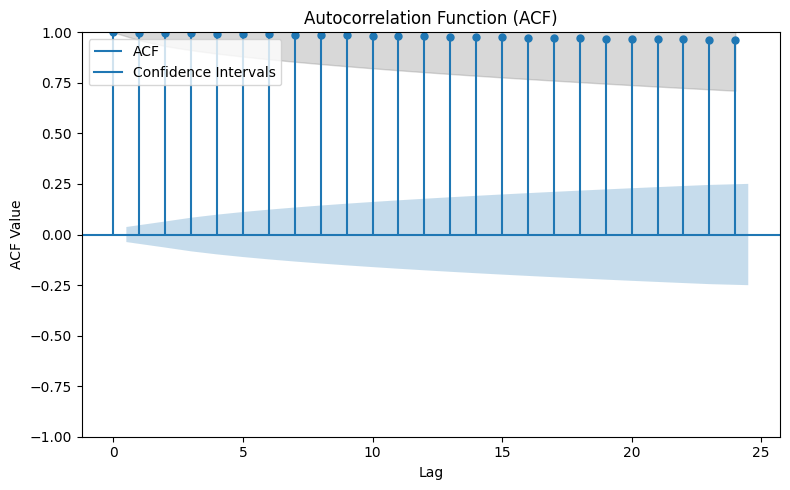

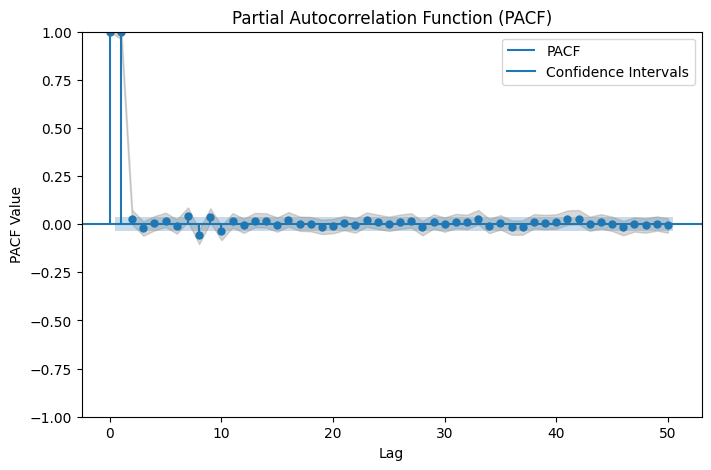

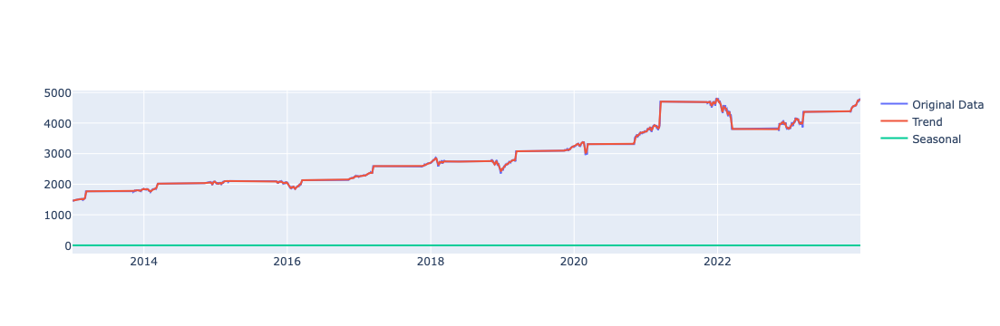


---

AAPL Analysis:


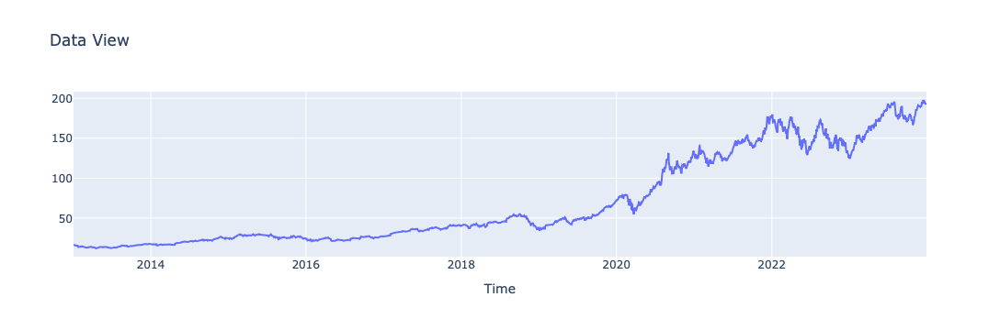

Stationarity Test:
Analysis Results:
ADF:
Passed: False
Test Results:
adf: {'statistic': 0.5211947155230396, 'p_value': 0.9855032533033131, 'critical_values': {'1%': -3.432731017363268, '5%': -2.862591962711835, '10%': -2.567329993388912}}


Missing Data:


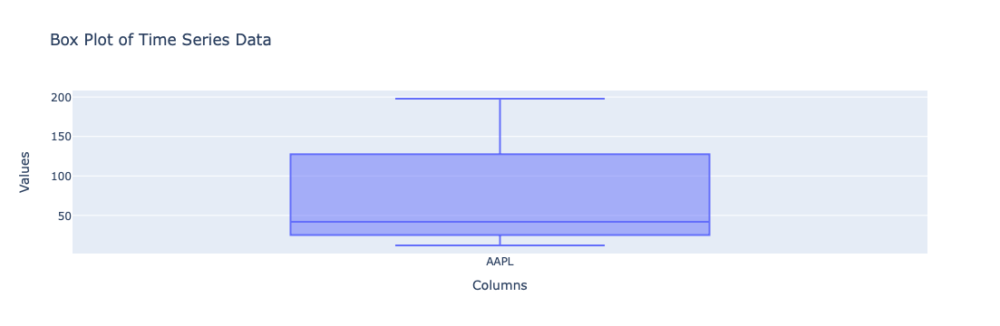

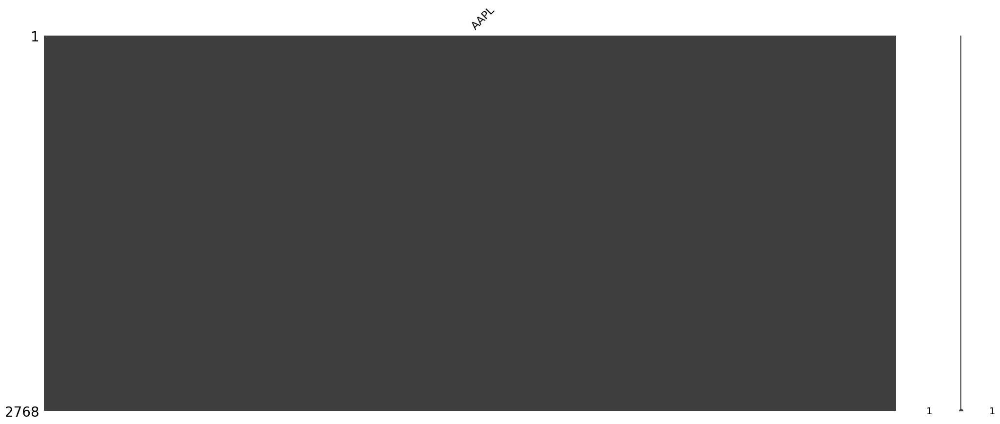

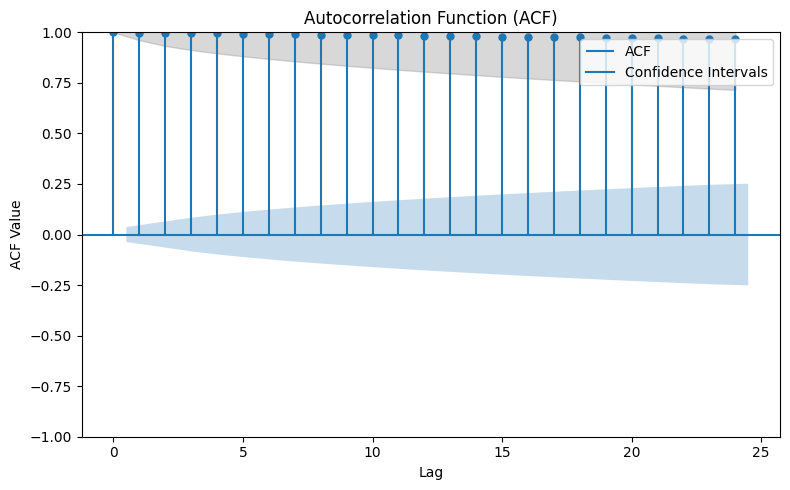

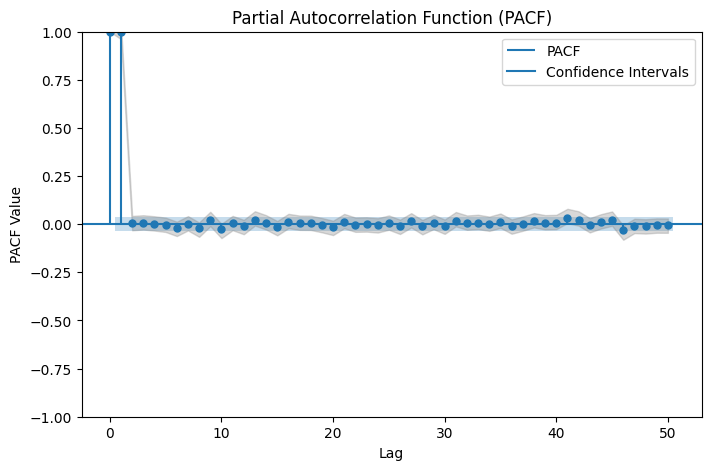

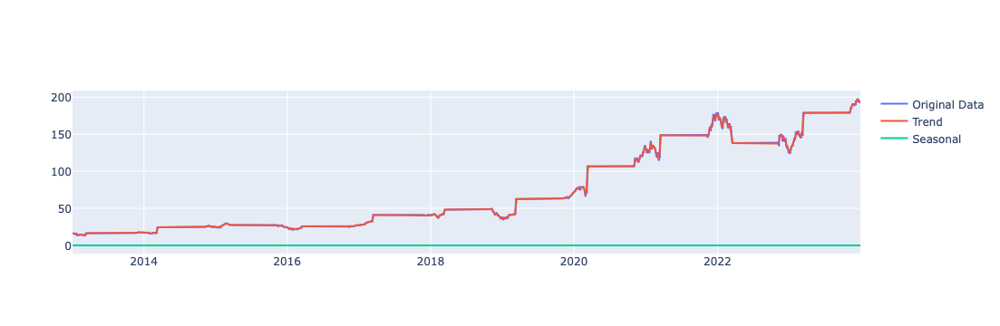


---

MSFT Analysis:


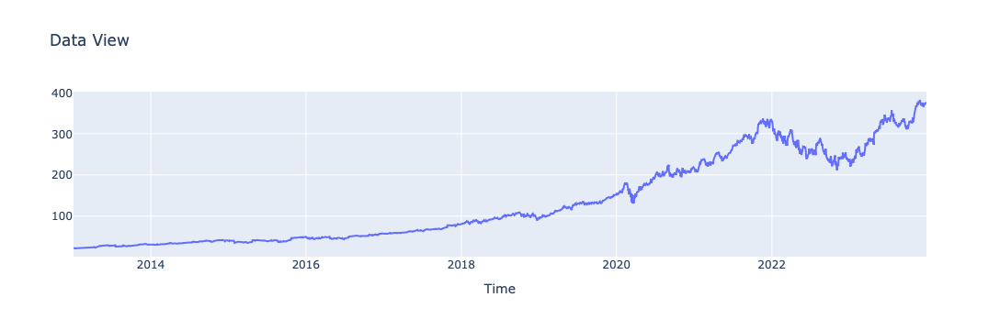

Stationarity Test:
Analysis Results:
ADF:
Passed: False
Test Results:
adf: {'statistic': 1.1992891142208726, 'p_value': 0.9959809679300855, 'critical_values': {'1%': -3.4327353600205757, '5%': -2.862593880583324, '10%': -2.5673310144635737}}


Missing Data:


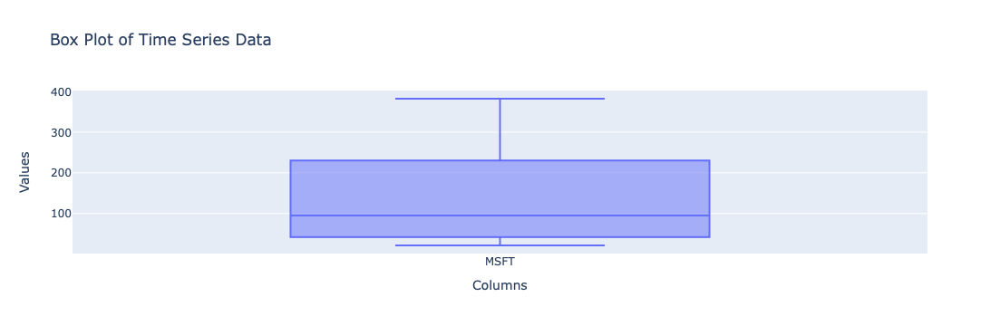

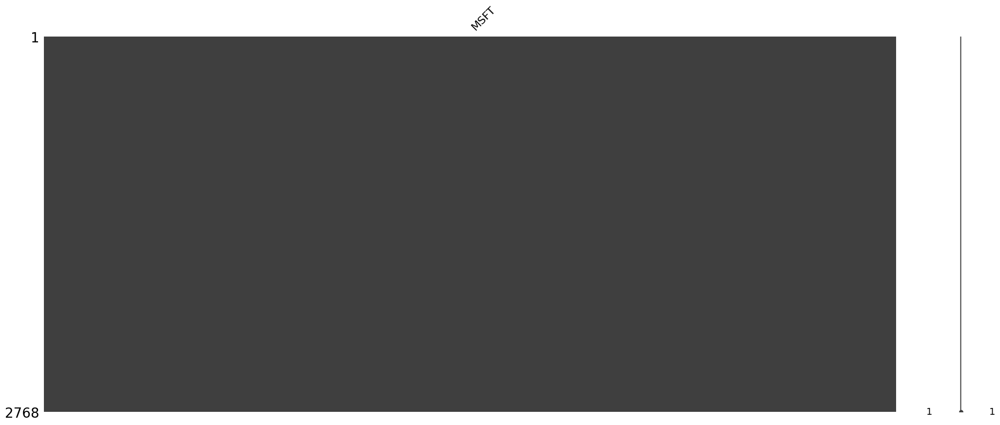

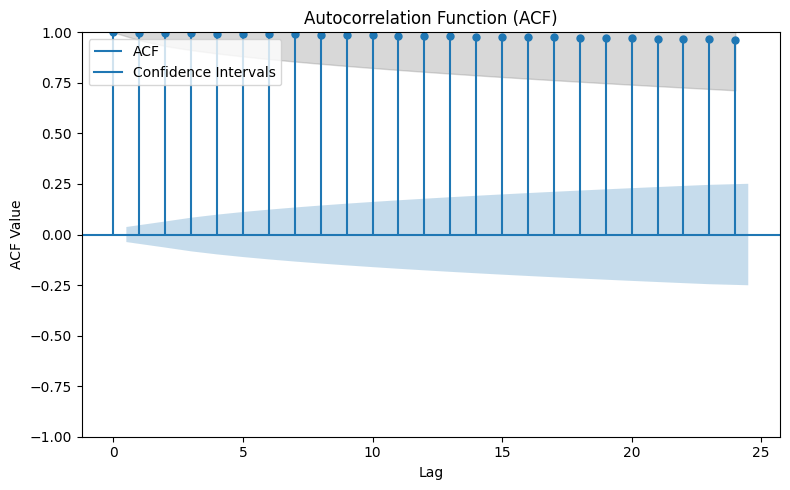

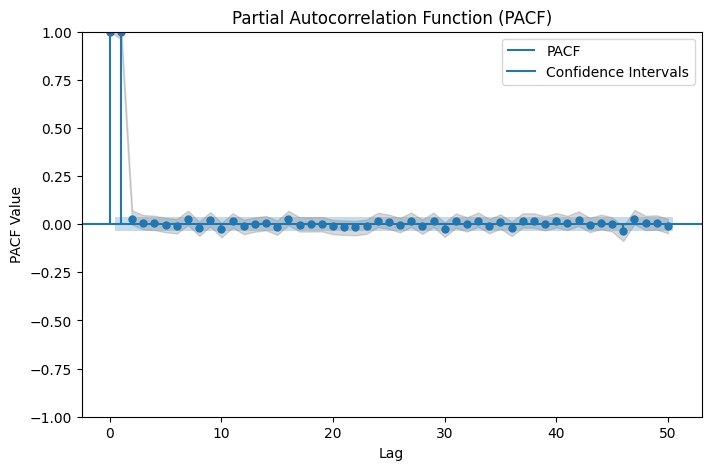

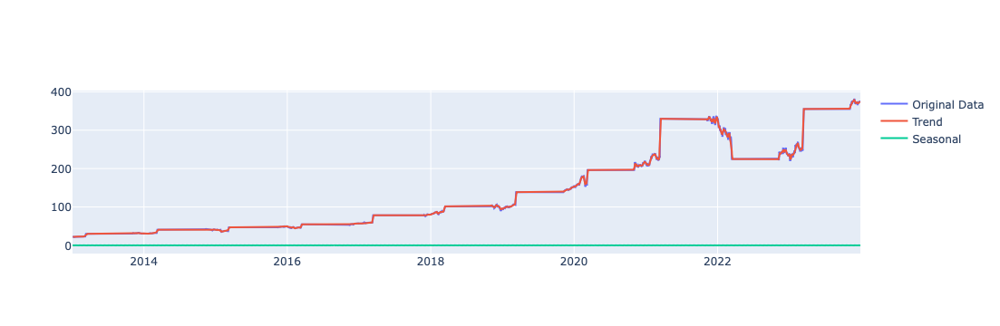


---



In [15]:
ts = dataset[feature_list]
tsa.run_multivariate_tests(ts)

## Start Explore

Run the cell below to initialize Time Series Analyzer module for conducting stationarity tests, autocorrelations, variance checks among multiple variables and many more exploratory tests.
[CPI Explore](#CPI-Explore)

The only libraries used here which are outside standard python are as follows:
- plotly
- matplotlib
- statsmodels
- sklearn
- missingno

Use this command to download them if you do not have them in the running kernel:

``` pip install plotly matplotlib statsmodels sklearn missingno ```



In [3]:
# Codes Run:
import datetime
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
from plotly.offline import init_notebook_mode, iplot
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import matplotx
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
import missingno as msno
init_notebook_mode(connected=True)
import warnings
warnings.filterwarnings("ignore")


class TSAnalysis:
    def plot_data(self, df, title='', columns=None, label=''):
        """Plot the data in the DataFrame."""
        traces = []
        if columns is None:
            columns = df.columns
        for c in columns:
            traces.append(go.Scatter(x=df.index, y=df[c].values, name=str(c)))
        fig = go.Figure(traces)
        fig.update_layout(title=title, xaxis_title='Time', yaxis_title=label)
        return fig
        
    def adf_test(self, df):
        """Perform Augmented Dickey-Fuller test for stationarity on the DataFrame."""
        result = adfuller(df)
        adf_statistic = result[0]
        p_value = result[1]
        critical_values = result[4]
        adf_results = {
            'statistic': adf_statistic,
            'p_value': p_value,
            'critical_values': critical_values
        }
        return p_value < 0.05,{'adf': adf_results}

    def kpss_test(self, df):
        """Perform Kwiatkowski-Phillips-Schmidt-Shin test for stationarity on the DataFrame."""
        result = kpss(df)
        kpss_statistic = result[0]
        p_value = result[1]
        critical_values = result[3]
        kpss_results = {
            'statistic': kpss_statistic,
            'p_value': p_value,
            'critical_values': critical_values
        }
        return p_value < 0.05,{'kpss': kpss_results}
    
    def print_results(self, result):
        """Print the results of the stationarity tests."""
        print("Analysis Results:")
        for test_name, test_result in result.items():
            print(f"{test_name.upper()}:")
            print(f"Passed: {test_result['passed']}")
            print("Test Results:")
            for key, value in test_result['test_result'].items():
                print(f"{key}: {value}")
            print("\n")
            
    def run_univariate_tests(self, df, tests=['adf']):
        """Run univariate stationarity and other tests on the DataFrame."""
        result = {}
        for test_name in tests:
            if test_name == 'adf':
                passed, test_result = self.adf_test(df)
            elif test_name == 'kpss':
                passed, test_result = self.kpss_test(df)
            else:
                passed, test_result = False, None
            
            result[test_name] = {
                'passed': passed,
                'test_result': test_result
            }
        iplot(self.plot_data(df, 'Data View', list(df.columns)))
        print("Stationarity Test:")
        self.print_results(result)
        # msno.matrix(df)
        self.show_boxplot(df)
        ac = self.find_autocorrelation(df)
        pac = self.find_partautocorrelation(df)
        self.find_seasonality(df)            
        return result

    def find_autocorrelation(self, df, lags=24):
        """Find autocorrelation in the DataFrame."""
        # lags = round(len(df) / 2)
        acf_vals, conf_int = sm.tsa.stattools.acf(df, nlags=lags, fft=True, alpha=0.05)
        fig, ax = plt.subplots(figsize=(10, 5))
        plt.tight_layout()
        plot_acf(df.values, ax=ax, lags=lags)
        ax.fill_between(range(len(acf_vals)), conf_int[:, 0], conf_int[:, 1], color='gray', alpha=0.3)
        ax.set_title('Autocorrelation Function (ACF)')
        ax.set_xlabel('Lag')
        ax.set_ylabel('ACF Value')
        ax.legend(['ACF', 'Confidence Intervals'])
        plt.show()
        return {
            'acf_vals': acf_vals,
            'confidence_intervals': conf_int
        }

    def find_partautocorrelation(self, df, lags=50):
        """Find partial autocorrelation in the DataFrame."""
        pacf_vals, conf_int = sm.tsa.stattools.pacf(df, nlags=lags, alpha=0.05)
        fig, ax = plt.subplots(figsize=(10, 5))
        plt.tight_layout()
        plot_pacf(df.values, ax=ax, lags=lags)
        ax.fill_between(range(len(pacf_vals)), conf_int[:, 0], conf_int[:, 1], color='gray', alpha=0.3)
        ax.set_title('Partial Autocorrelation Function (PACF)')
        ax.set_xlabel('Lag')
        ax.set_ylabel('PACF Value')
        ax.legend(['PACF', 'Confidence Intervals'])
        plt.show()
        return {
            'pacf_vals': pacf_vals,
            'confidence_intervals': conf_int
        }
    
    
    def find_seasonality(self, df):
        """Find seasonality in the DataFrame."""
        if ts.isna().any().any():
            return "Nan values in data."
        frequency = pd.infer_freq(df.index)
        missing = False
        df = df.asfreq(frequency) if frequency is not None else df.asfreq('B')
        try:
            self.decomposition = seasonal_decompose(df, 'additive')
        except:
            missing = True
        if df.isna().any().any() or missing:
            df = df.backfill()
        self.data = df
        self.decomposition = seasonal_decompose(df, 'additive')
        trend = self.decomposition.trend
        seasonal = self.decomposition.seasonal
        residual = self.decomposition.resid
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=df.index, y=df.values.flatten(), name='Original Data'))
        fig.add_trace(go.Scatter(x=trend.index, y=trend.values.flatten(), name='Trend'))
        fig.add_trace(go.Scatter(x=seasonal.index, y=seasonal.values.flatten(), name='Seasonal'))
        fig.show()
        seasonal_stats = {
            'seasonal_mean': np.mean(seasonal),
            'seasonal_std': np.std(seasonal),
            'seasonal_min': np.min(seasonal),
            'seasonal_max': np.max(seasonal)
        }
        return {'seasonality': seasonal_stats}
    
    def detrend(self):
        """Detrend the time series data."""
        trend = self.decomposition.trend
        trend = trend[self.data.index]
        detrended = (self.data.T - trend).T
        fig = sp.make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)
        fig.add_trace(go.Scatter(x=self.data.index, y=self.data.values.flatten(), name='Original'), row=1, col=1)
        fig.update_xaxes(title_text='Time', row=1, col=1)
        fig.update_yaxes(title_text='Original', row=1, col=1)
        fig.add_trace(go.Scatter(x=detrended.index, y=detrended.values.flatten(), name='Detrended'), row=2, col=1)
        fig.update_xaxes(title_text='Time', row=2, col=1)
        fig.update_yaxes(title_text='Detrended', row=2, col=1)
        fig.update_layout(height=600, width=800, title='Detrended Time Series')
        fig.show()
        return trend
    
    def deseasonalize(self):
        """Deseasonalize the time series data."""
        seasonal = self.decomposition.seasonal
        seasonal = seasonal[self.data.index]
        deseasonalized = (self.data.T - seasonal).T
        fig = sp.make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)
        fig.add_trace(go.Scatter(x=self.data.index, y=self.data.values.flatten(), name='Original'), row=1, col=1)
        fig.update_xaxes(title_text='Time', row=1, col=1)
        fig.update_yaxes(title_text='Original', row=1, col=1)
        fig.add_trace(go.Scatter(x=deseasonalized.index, y=deseasonalized.values.flatten(), name='Deseasonalized'), row=2, col=1)
        fig.update_xaxes(title_text='Time', row=2, col=1)
        fig.update_yaxes(title_text='Deseasonalized', row=2, col=1)
        fig.update_layout(height=600, width=800, title='Deseasonalized Time Series')
        fig.show()
        return seasonal
    
    def method_stationarize(self, df, method):
        """Apply a specified method to stationarize the data in the DataFrame."""
        if method == 'diff':
            return df.diff(1)[1:]
        elif method == 'diff_2':
            return df.diff(2)[2:]
        elif method == 'diff_3':
            return df.diff(3)[3:]
        elif method == 'log':
            return np.log(df).replace([np.inf, -np.inf], np.nan).dropna()
        elif method == 'log_diff':
            return np.log(df).diff(order).replace([np.inf, -np.inf], np.nan).dropna()
        elif method == 'std':
            t = StandardScaler()
            ret = t.fit_transform(df)
            return pd.DataFrame(ret, index=df.index, columns=df.columns)
        elif method == 'minmax':
            t = MinMaxScaler()
            ret = t.fit_transform(df)
            return pd.DataFrame(ret, index=df.index, columns=df.columns)
        
    
    def stationarize(self, df, method):
        """Stationarize the time series data using a specified method."""
        stationed = self.method_stationarize(df, method)
        print('Stationarized data')
        iplot(self.plot_data(stationed, 'Stationarized'))
        # res = self.run_tests(stationed)
        passed, test_result = self.adf_test(stationed)
        tresult={}
        tresult['ADF'] = {
                'passed': passed,
                'test_result': test_result
            }
        self.print_results(tresult)
        return stationed

    def impute_missing_values(self, df, method='mean'):
        """Impute missing values in the DataFrame using a specified method."""
        if method == 'mean':
            return df.fillna(df.mean())
        elif method == 'median':
            return df.fillna(df.median())
        elif method == 'linear':
            return df.interpolate(method='linear')
        elif method == 'spline':
            return df.interpolate(method='spline', order=3)
        else:
            raise ValueError("Invalid imputation method. Choose from: 'mean', 'median', 'linear', 'spline'")


    def show_boxplot(self, df):
        """Show a boxplot of the DataFrame."""
        fig = go.Figure()
        for column in df.columns:
            fig.add_trace(go.Box(
                y=df[column],
                name=column
            ))
        fig.update_layout(
            title='Box Plot of Time Series Data',
            yaxis_title='Values',
            xaxis_title='Columns'
        )
        fig.show()

    def correlation_matrix(self, df):
        """Calculate and visualize the correlation matrix of the DataFrame."""
        corr_matrix = df.corr()
        fig = go.Figure(data=go.Heatmap(
            z=corr_matrix.values,
            x=corr_matrix.columns,
            y=corr_matrix.index,
            colorscale='Blues',
            colorbar=dict(title='Correlation Coefficient')
        ))
        
        for i in range(len(corr_matrix.columns)):
            for j in range(len(corr_matrix.columns)):
                fig.add_annotation(
                    x=corr_matrix.columns[i],
                    y=corr_matrix.columns[j],
                    text=str(round(corr_matrix.iloc[i, j], 2)),
                    showarrow=False,
                    font=dict(color="white" if abs(corr_matrix.iloc[i, j]) > 0.5 else "black")
                )
        
        fig.update_layout(
            title='Correlation Matrix',
            xaxis_nticks=36,
            yaxis_nticks=36,
            xaxis_title='Variables',
            yaxis_title='Variables'
        )
        
        fig.show()
        return corr_matrix

    def calculate_vif(self, df):
        """Calculate the Variance Inflation Factor (VIF) for the DataFrame."""
        df_numeric = df.select_dtypes(include=[np.number])
        vif_data = pd.DataFrame()
        vif_data["feature"] = df_numeric.columns
        vif_data["VIF"] = [variance_inflation_factor(df_numeric.values, i) for i in range(df_numeric.shape[1])]
        vif_data = vif_data.sort_values(by="VIF", ascending=False)
        
        fig = go.Figure()
        fig.add_trace(go.Bar(
            x=vif_data["feature"],
            y=vif_data["VIF"],
            text=vif_data["VIF"].round(2),
            textposition='outside',
            marker=dict(color='rgba(65, 65, 80, 0.6)')
        ))
        
        fig.update_layout(
            title="Variance Inflation Factor (VIF)",
            xaxis_title="Features",
            yaxis_title="VIF",
            showlegend=False
        )
        
        iplot(fig)

        return vif_data

    def run_multivariate_tests(self, df, tests=['adf']):
        """Run multivariate stationarity tests on the DataFrame."""
        self.datachecks(df)
        c = self.correlation_matrix(df)
        v = self.calculate_vif(df)
        for col in df.columns:
            print(f"{col} Analysis:")
            self.run_univariate_tests(df[[col]])
            print("\n---\n")
            

    def datachecks(self, df):
        """Perform data checks and handle missing values in the DataFrame."""
        for col in df.columns:
            if df[col].isna().any():
                self.impute_missing_values(df[[col]], 'spline')


## Conclusion

That ends my demo of TSAnalyzer.
The motivation to build this was a simple class to conduct most of what is needed as exploratory analysis for time series data of any kind ranging from fixed seasonals, trending financial data or routine cyclical data.

## References

[https://www.statsmodels.org/dev/graphics.html#boxplots]
[https://machinelearningmastery.com/gentle-introduction-autocorrelation-partial-autocorrelation/]
